# Content

In this report, we conduct analysis from 5 aspects.


1. Number of accidents per district  

2. Vehicles or Pedestrian involved, Weekday and Hour Breakdown

3. Most Dangerous Roads

4. Most accidents Spots

5. Medical Rescue Facilities


---
# 1. Number of accidents per district

In [1]:
# import packages

import numpy as np
import pandas as pd
pd.options.display.max_columns = None

import altair as alt
from vega_datasets import data
import folium
import geopandas as gpd
alt.data_transformers.disable_max_rows()
import osmnx as ox

import matplotlib.pyplot as plt

In [2]:
# Import dataset
# Rename "geometry" to avoid ambiguity
acc = gpd.read_file("accidents.geojson") # 6772
acc.rename(columns={"geometry":"geo_point"}, inplace=True)

# Order Months name and convert the column to caategorical
# Order Weekday name and convert the column to caategorical
month_order = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
acc['month'] = pd.Categorical(acc['month'], categories=month_order, ordered=True)
weekday_order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]
acc['weekday'] = pd.Categorical(acc['weekday'], categories=weekday_order, ordered=True)

# Import dataset
# Rename "geometry" and "name" to avoid ambiguity
dis = gpd.read_file("districts.geojson") # 30
dis.rename(columns={"geometry":"geo_poly", "name":"district_name"}, inplace=True)

# Import dataset
# Rename "geometry" and "name" to avoid ambiguity
roa = gpd.read_file("roads.geojson") # 5351
roa.rename(columns={"geometry":"geo_line", "name":"roa_name"}, inplace=True)

In [3]:
# Define function to merge accident points in district
def geo_check(geo_point):

    """
    Accident points are input to the function. 
    Through looping all district polygons in district dataset, the district, where the accident point happened, is returned.
    """
    for i, poly in enumerate(dis['geo_poly']):

        if geo_point.within(poly):
            return poly

In [4]:
# Apply defined function merge the district to the accident points
acc['geo_poly'] = acc['geo_point'].map(lambda x: geo_check(x))
acc = acc.merge(dis[['district_name', 'geo_poly']], on="geo_poly", how="left")

<h3>The Figure</h3>

The following figure shows the districts of Kiel. Each district is separated by the black boarder. The color of the districts representing the number of accidents happened in the corresponding districts, the darker the color is, the more the number of cases happened. 

Blue dots are the 25 cases happened NOT in Kiel. Some of the 25 cases happened nearby the boarder of Kiel (e.g. Ravensberg and Elmschenhagen), but, according to the provided location data, they should not be classified as accidents in Kiel.

Put the cursors on the figure, tooltips would show (1) District Name and (2) Number of accidents happened in the district.

<h3>Brief Observation</h3>

Südfriedhof had the largest number of accidents, 783 cases over the year, followed by Gaarden-Süd/Kronsburg, Gaarden-Ost, and Schreventeich, each has 545, 528 and 514 cases. They are the four districts had over 500 cases.
All of them are at the center of Kiel. The rest ot the districts have arbitrary number of cases. As further the city center, as fewer accidents had happened. It is also worth mentioning, Rönne has only one accident recorded.

In [5]:
# Prepare the background color, zoom rate, and locations of the figure by using "folium"
# Label "Not-in-Kiel" accidents with different color
# Count the number of accidents happened in each district
# Convert dataframe to GeoDataFrame for further analysis
# Return the figure

# Folium preparation
m = folium.Map(location=[54.34,10.13], zoom_start=11, tiles='CartoDB positron') #, height=500, width=1000)

# Label "Not-in-Kiel" accident points
not_in_kiel = gpd.GeoDataFrame(acc.loc[acc[acc['geo_poly'].isnull()].index], crs="EPSG:25832", geometry='geo_point').explore(m=m, color="blue")

# Count the number of accidents happened in each district
# Rename the column
# Convert dataframe to GeoDataFrame for further analysis
district_map = acc[['district_name', 'geo_poly', 'pedestrian']].groupby(by=["district_name", 'geo_poly']).pedestrian.count().reset_index()
district_map = district_map.rename(columns={'pedestrian':'number_of_cases'})
district_map = gpd.GeoDataFrame(district_map, crs="EPSG:25832", geometry='geo_poly')

# Return figure
gpd.GeoDataFrame(district_map).explore(column='number_of_cases', cmap='Wistia', m=not_in_kiel, style_kwds=dict(color="black"))

In [6]:
# Drop the 25 "Not-in-Kiel" cases
# Reset dataframe index
# Convert the dataframe from Pandas back to GeoDataFrame
acc.dropna(subset=["geo_poly"], inplace=True)   
acc = acc.reset_index()
acc = gpd.GeoDataFrame(acc, crs="EPSG:25832", geometry='geo_point')

---
# 2. Vehicles or Pedestrian involved, Weekday and Hour Breakdown

In this section, we analyze the number of accidents by vehicles or pedestrian involved, on weekday and at hour time.

Each case has more than one involvement is divided into separated cases. For example, "car" and "pedestrian" are involved in case 1, case 1 becomes two records.  
On newly generated feature "veh_ped", one record labeled "car" and another labeled "pedestrian", other features are the same.  
Total number of accidents including all vehicles and pedestrian is not considered in this section because the total number contains duplicated cases as mentioned in example above.  
Yet, total number of accidents against each involvement does not have the same deplicates problem.

The number of accidents with different involvement could be easily interpreted against weekday, locations, and hours, in the follow figure.

In [7]:
# Fill the null value in "truck" column with 0
acc['truck'] = acc['truck'].fillna(0)

In [8]:
# Prepare list of involvement features
li_involvement = ['car', 'bike', 'pedestrian', 'motorcycle', 'truck', 'other']

# Prepare data without affect the original dataframe
# Convert string type "1" and "0" in involvment features to numeric values
# Use stack to put invovlement features to new column and value of features in another column
# Rename the columns
a = acc.copy()
a[li_involvement] = a[li_involvement].apply(pd.to_numeric)
involvement = a[li_involvement].stack(future_stack=True).reset_index()
involvement.rename(columns={"level_0":"case_index", "level_1":"veh_ped", 0:"Yes"}, inplace=True)

# Keep only the records with involvement, all 0 are dropped
involvement = involvement[involvement['Yes']!=0]

# Extract longitude and latitude from geometry point
# Reset index for merging
a['longitude'] = a['geo_point'].to_crs("EPSG:4326").x
a['latitude'] = a['geo_point'].to_crs("EPSG:4326").y
a = a.reset_index()

# Merge dataframe
# Extract needed features only
res = pd.merge(involvement, a, left_on="case_index", right_on="level_0", how="left")
res = res[['case_index', 'veh_ped', 'weekday', 'hour', 'longitude', 'latitude']]

# Result check
res.head(5)

,case_index,veh_ped,weekday,hour,longitude,latitude
0,0,car,Wednesday,7,10.124424,54.307816
1,0,pedestrian,Wednesday,7,10.124424,54.307816
2,1,car,Tuesday,11,10.121755,54.304249
3,1,truck,Tuesday,11,10.121755,54.304249
4,2,other,Friday,6,10.139027,54.310280


In [9]:
# Prepare filters
click_veh_ped = alt.selection_point(encodings=['color'], fields=['veh_ped'])
click_weekday = alt.selection_point(encodings=['color'], fields=['weekday'])

# Bar chart for involvments
bar_veh_ped = alt.Chart(res, title='Vehicles and Pedestrian').mark_bar().encode(
    x='veh_ped:N',
    y='count(veh_ped):Q',
    color = alt.condition(click_veh_ped, 'veh_ped:N', alt.value('lightgray')),
).add_params(click_veh_ped).transform_filter(click_weekday).properties(width=200, height=800)

# Bar chart for weekday
bar_weekday = alt.Chart(res, title="Number of accidents on Weekday").mark_bar().encode(
    x=alt.X('weekday:N', sort=["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]),
    y='count(weekday):Q',
    color=alt.condition(click_weekday, 'veh_ped:N', alt.value('lightgray'))
).add_params(click_weekday).transform_filter(click_veh_ped).properties(width=250, height=800)

# Scatter plot for accident locations
points = alt.Chart(res, title='Locations of accidents').mark_point().encode(
    x=alt.X('longitude:Q', scale=alt.Scale(domain=[10.03, 10.23])),
    y=alt.Y('latitude:Q', scale=alt.Scale(domain=[54.24, 54.44])),
    color=alt.condition(click_veh_ped, 'veh_ped:N', alt.value('lightgray'), legend=None),
    tooltip=['longitude', 'latitude']
).transform_filter(click_veh_ped).transform_filter(click_weekday).properties(width=800, height=800)

# Bar chart for hour
bar_hour = alt.Chart(res, title="Number of accidents in Hours").mark_bar().encode(
    x='hour:N',
    y='count(hour):Q',
    color=alt.condition(click_veh_ped, 'veh_ped:N', alt.value('lightgray'))
).transform_filter(click_veh_ped).transform_filter(click_weekday).properties(width=1395, height=100)

<h3>The Figures</h3>

The following figures demonstrate the break down pattern of 4 features, vehicles or pedesrian involved, weekday, hour, and the locations of the accidents.

The two bar charts, "bar_veh_ped" and "bar_weekday", are clickable to performe as two-layer filters.  
By choosing the desired "vehicles or pedesrian involved" and then the "weekday", the scatter plot, "points" and bar chart at the bottom, "bar_hour" shows the filtered results of the accidents.

For example, first click "truck" in "bar_veh_ped", then click "Monday" in "bar_weekday". The result in scatter plot "points" and bar chart "bar_hour" will show all the accidents involving truck happened on Monday.

<h3>Brief Observation</h3>

Weekends always have fewer accidents compared to weekdays for each involvment.  
Afternoon and early morning around 6 to 7 o'clock have relatively more accidents that is easily explained as consequence of peak hours.  
Most of the truck accidents happened happened during weekday on the highways.   

In [10]:
(bar_veh_ped | bar_weekday | points) & (bar_hour)

alt.VConcatChart(...)

---
# 3. Most Dangerous Roads

The geometry point of each accident is "buff" into a bigger geometry polygon, in order to find the corresponding road the accident happened. 

Some of the accidents happened at the intersection location of more than one road. In these cases, the same case can have more than one record in newly generated dataframe.  
Only the names of the roads are considened but types of the roads are not concerned in this analysis.  

For example, "case index 3" happened at 7 o'clock on Tuesday, January 2016 were located on Ringstraße and Königsweg.  
Ringstraße and Königsweg both of each have different parts and road types. After dropping duplicated different parts and road types of the same roads, only two records remain for this single case.

In [11]:
# Prepare data without affect the original dataframe
acc_roa = acc.copy()

# Buff each accident point to be bigger a polygon
buffer = 5
acc_roa['geometry_buff'] = gpd.GeoSeries(acc_roa.geo_point).buffer(buffer)

# Convert dataframe to GeoDataFrame for further merging
acc_roa = gpd.GeoDataFrame(acc_roa, crs="EPSG:25832", geometry='geometry_buff')
roa = gpd.GeoDataFrame(roa, crs="EPSG:25832", geometry='geo_line')

# Join accidents with roads by merging the intersecting locations of accident points and road lines
acc_roa = gpd.sjoin(acc_roa, roa, how='left', predicate='intersects')

# Result check
acc_roa.head(10)

,index,year,month,hour,weekday,harm_type,type1,type2,light_conditions,bike,car,pedestrian,motorcycle,truck,other,geo_point,geo_poly,district_name,geometry_buff,index_right,osmid,roa_name,road_type,wikidata
0,0,2016,January,7,Wednesday,Slightly Injured,Collision between vehicle and pedestrian,Accident caused by crossing the road,Twilight,0,1,1,0,0,0,POINT (573159.144 6018353.323),"POLYGON ((571018.710 6019653.741, 571052.108 6...",Südfriedhof,"POLYGON ((573164.144 6018353.323, 573164.120 6...",1316.0,2.715229e+07,Hamburger Chaussee,secondary,None
1,1,2016,January,11,Tuesday,Slightly Injured,Collision with another vehicle moving laterall...,Accident between vehicles moving along in carr...,None,0,1,0,0,1,0,POINT (572991.842 6017953.685),"POLYGON ((568971.889 6016880.520, 569069.619 6...",Hassee,"POLYGON ((572996.842 6017953.685, 572996.818 6...",90.0,5.045313e+06,Theodor-Heuss-Ring,trunk,None
2,2,2016,January,6,Friday,Slightly Injured,"Collision with another vehicle which starts, s...",Accident involving stationary,Twilight,0,0,0,0,0,1,POINT (574104.830 6018642.713),"POLYGON ((573774.230 6018718.715, 573911.856 6...",Gaarden-Ost,"POLYGON ((574109.830 6018642.713, 574109.806 6...",5192.0,1.155320e+09,Werftstraße,secondary,Q62556822
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2676.0,1.517023e+08,Ringstraße,secondary,None
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2416.0,1.116412e+08,Königsweg,residential,None
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2458.0,1.212430e+08,Ringstraße,secondary,None
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2460.0,1.212430e+08,Ringstraße,secondary,None
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2454.0,1.212430e+08,Königsweg,residential,None
4,4,2016,January,4,Sunday,Slightly Injured,Accident of another kind,Driving accident,Twilight,0,0,0,1,0,0,POINT (575998.620 6019246.232),"POLYGON ((575058.815 6020243.194, 575291.430 6...",Ellerbek,"POLYGON ((576003.620 6019246.232, 576003.596 6...",3438.0,3.802178e+08,Ostring,primary,Q62273901
4,4,2016,January,4,Sunday,Slightly Injured,Accident of another kind,Driving accident,Twilight,0,0,0,1,0,0,POINT (575998.620 6019246.232),"POLYGON ((575058.815 6020243.194, 575291.430 6...",Ellerbek,"POLYGON ((576003.620 6019246.232, 576003.596 6...",3434.0,3.802178e+08,Franziusallee,residential,None


In [12]:
# Prepare a list of features to determine duplicates threshold
# Drop duplicates
colname = ['year', 'month', 'hour', 'weekday', 'harm_type', 'type1', 'type2', 
           'light_conditions', 'bike', 'car', 'pedestrian', 'motorcycle', 'truck', 'other', 
           'geo_point', 'geo_poly', 'district_name', 'geometry_buff', 'roa_name']

acc_roa = acc_roa.drop_duplicates(subset=colname)

# Result check
acc_roa.head(10)

,index,year,month,hour,weekday,harm_type,type1,type2,light_conditions,bike,car,pedestrian,motorcycle,truck,other,geo_point,geo_poly,district_name,geometry_buff,index_right,osmid,roa_name,road_type,wikidata
0,0,2016,January,7,Wednesday,Slightly Injured,Collision between vehicle and pedestrian,Accident caused by crossing the road,Twilight,0,1,1,0,0,0,POINT (573159.144 6018353.323),"POLYGON ((571018.710 6019653.741, 571052.108 6...",Südfriedhof,"POLYGON ((573164.144 6018353.323, 573164.120 6...",1316.0,2.715229e+07,Hamburger Chaussee,secondary,None
1,1,2016,January,11,Tuesday,Slightly Injured,Collision with another vehicle moving laterall...,Accident between vehicles moving along in carr...,None,0,1,0,0,1,0,POINT (572991.842 6017953.685),"POLYGON ((568971.889 6016880.520, 569069.619 6...",Hassee,"POLYGON ((572996.842 6017953.685, 572996.818 6...",90.0,5.045313e+06,Theodor-Heuss-Ring,trunk,None
2,2,2016,January,6,Friday,Slightly Injured,"Collision with another vehicle which starts, s...",Accident involving stationary,Twilight,0,0,0,0,0,1,POINT (574104.830 6018642.713),"POLYGON ((573774.230 6018718.715, 573911.856 6...",Gaarden-Ost,"POLYGON ((574109.830 6018642.713, 574109.806 6...",5192.0,1.155320e+09,Werftstraße,secondary,Q62556822
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2676.0,1.517023e+08,Ringstraße,secondary,None
3,3,2016,January,7,Tuesday,Slightly Injured,Collision with another vehicle which turns int...,Accident caused by turning into a road or by c...,Twilight,0,1,0,1,0,0,POINT (573294.512 6019242.699),"POLYGON ((573292.725 6019242.209, 573303.309 6...",Vorstadt,"POLYGON ((573299.512 6019242.699, 573299.488 6...",2416.0,1.116412e+08,Königsweg,residential,None
4,4,2016,January,4,Sunday,Slightly Injured,Accident of another kind,Driving accident,Twilight,0,0,0,1,0,0,POINT (575998.620 6019246.232),"POLYGON ((575058.815 6020243.194, 575291.430 6...",Ellerbek,"POLYGON ((576003.620 6019246.232, 576003.596 6...",3438.0,3.802178e+08,Ostring,primary,Q62273901
4,4,2016,January,4,Sunday,Slightly Injured,Accident of another kind,Driving accident,Twilight,0,0,0,1,0,0,POINT (575998.620 6019246.232),"POLYGON ((575058.815 6020243.194, 575291.430 6...",Ellerbek,"POLYGON ((576003.620 6019246.232, 576003.596 6...",3434.0,3.802178e+08,Franziusallee,residential,None
5,5,2016,January,11,Thursday,Slightly Injured,Leaving the carriageway to the left,Driving accident,None,0,1,0,0,0,1,POINT (574749.345 6018287.240),"POLYGON ((573774.230 6018718.715, 573911.856 6...",Gaarden-Ost,"POLYGON ((574754.345 6018287.240, 574754.321 6...",4017.0,5.511157e+08,Preetzer Straße,tertiary,None
5,5,2016,January,11,Thursday,Slightly Injured,Leaving the carriageway to the left,Driving accident,None,0,1,0,0,0,1,POINT (574749.345 6018287.240),"POLYGON ((573774.230 6018718.715, 573911.856 6...",Gaarden-Ost,"POLYGON ((574754.345 6018287.240, 574754.321 6...",2858.0,1.889985e+08,Ostring,primary,Q62273901
6,6,2016,January,17,Monday,Slightly Injured,Collision with another vehicle moving ahead or...,Accident between vehicles moving along in carr...,Twilight,0,1,0,0,0,0,POINT (572994.862 6020117.808),"POLYGON ((571214.029 6020668.789, 571270.005 6...",Schreventeich,"POLYGON ((572999.862 6020117.808, 572999.838 6...",4515.0,7.822871e+08,Eckernförder Straße,secondary,Q62018843


The goal in this section is to find out where accidents happened most. Even though same case on roads intersection are double counted, the result figure would not be affected. (The same case would be pointed at the same location.)

In this investigation, we focus on the most dangerous roads, where over 100 accidents happened.  
There are 18 roads had over 100 accidents. 4 of them had over 200 accidents. 

In [13]:
acc_roa['roa_name'].value_counts().head(20)

roa_name
Theodor-Heuss-Ring        307
Ostring                   287
Holtenauer Straße         261
Westring                  257
Eckernförder Straße       175
Skandinaviendamm          158
Knooper Weg               147
Werftstraße               145
Hamburger Chaussee        140
Preetzer Straße           125
Feldstraße                119
Olof-Palme-Damm           118
Rendsburger Landstraße    117
Gutenbergstraße           114
Kronshagener Weg          111
Kaistraße                 110
Sophienblatt              107
Olshausenstraße           105
Schützenwall               99
Fördestraße                85
Name: count, dtype: int64

<h3>The Figure</h3>

The following figure shows the roads, comprised of most of the accidents. 

Red roads are the roads with more 200 accidents and green roads are the roads with more than 100 accidents over the year.

<h3>Brief Observation</h3>

The roads showed in the figure are where accidents frequently happened. However, it is reminded that the length of the roads are long compared to others. There is no obvious evident the high number of accidents happened is due to the designs or locations of the roads


In [14]:
# Separate roads have over 200 cases and roads have number of cases between 100 and 200
top_1 = list(acc_roa['roa_name'].value_counts().head(4).index)
top_2 = list(acc_roa['roa_name'].value_counts()[4:18].index)

# Use "folium" control the return background color, location and zoom rate
# Use different colors to represent two kinds of roads
m = folium.Map(location=[54.33,10.13], zoom_start=13, tiles='CartoDB positron')
over200 = acc_roa[acc_roa ['roa_name'].isin(top_1)].explore(m=m, color="red")
over100 = acc_roa[acc_roa ['roa_name'].isin(top_2)].explore(m=over200, color="lightseagreen")

# Return map
over100

---
# 4. Most accidents Spots

This section investigated the spots, where most of the accidents happened.

The accidents are firstly segmented to two groups by "harm_type", (1) Slightly Injured Group and (2) 'Severely Injured' and 'Killed' Group.

In [15]:
# define a function to check accident location overlapping
def overlap_case(buff_poly, df):

    """
    This function compares every accident in each loop.
    Using "intersects" function from geopandas, "True" means the location of the input point and that of the compared point are overlapped in certain extend.
    A list of indexes of the points overlapped is returned. 
    The list includes the input point, which means:
        if the return list contains only one point = itself, no overlapping accident
        if the return list contains more than one point, there are overlapping accidents
    """

    li_overlap = []
    for point in zip(df.index, df['geometry_buff_overlap']):
        if buff_poly.intersects(point[1]):
            li_overlap.append(point[0])
    
    return li_overlap

In [16]:
# Extract "Slightly Injured" Group
overlap_slight = acc[acc['harm_type']=="Slightly Injured"].copy()

# Buff the geometry points to bigger polygons
buffer = 10
overlap_slight['geometry_buff_overlap'] = gpd.GeoSeries(overlap_slight.geo_point).buffer(buffer)

# Apply predefined function to find the intersecting ("overlapping") accidents
# Calculate the length of the return overlapping list for each accident
# Convert the latest dataframe to GeoDataFrame format for further analysis
overlap_slight['overlap_case'] = overlap_slight['geometry_buff_overlap'].map(lambda x: overlap_case(x, overlap_slight))
overlap_slight['overlap_len'] = overlap_slight['overlap_case'].map(lambda x: len(x))
overlap_slight = gpd.GeoDataFrame(overlap_slight, crs="EPSG:25832", geometry='geometry_buff_overlap')

In [17]:
# Check the result brief descriptions
overlap_slight['overlap_len'].describe()

count    6140.000000
mean        5.100326
std         5.109713
min         1.000000
25%         1.000000
50%         3.000000
75%         7.000000
max        28.000000
Name: overlap_len, dtype: float64

In [18]:
# Extract "Severely Injured" and "Killed" Group
overlap_02 = acc[acc['harm_type'].isin(['Severely Injured', 'Killed'])].copy()

# Buff the geometry points to bigger polygons
buffer = 10
overlap_02['geometry_buff_overlap'] = gpd.GeoSeries(overlap_02.geo_point).buffer(buffer)

# Apply predefined function to find the intersecting ("overlapping") accidents
# Calculate the length of the return overlapping list for each accident
# Convert the latest dataframe to GeoDataFrame format for further analysis
overlap_02['overlap_case'] = overlap_02['geometry_buff_overlap'].map(lambda x: overlap_case(x, overlap_02))
overlap_02['overlap_len'] = overlap_02['overlap_case'].map(lambda x: len(x))
overlap_02 = gpd.GeoDataFrame(overlap_02, crs="EPSG:25832", geometry='geometry_buff_overlap')

In [19]:
# Check the result brief descriptions
overlap_02['overlap_len'].describe()

count    607.000000
mean       1.369028
std        0.805650
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        6.000000
Name: overlap_len, dtype: float64

<h3>The Figure</h3>

The following figure shows all the "most frequent spots".

The green represents "Slightly Injured" Group data, which are considered as most frequent spots but relatively less dangerous.  
The red represents 'Severely Injured' and 'Killed' Group, which are considered as frequent and most dangerous spots.  
For simplification and comprison, only roads, where any accident had ever happened before, are shown in the figure, but not every road in Kiel.

Remarks:  
For "Slightly Injured" Group, only spots with at least 10 overlapping cases are showed.  
For "'Severely Injured' and 'Killed'" Group, spots with at least one overlapping cases are showed.

<h3>Brief Observation</h3>

Even though many of the accidents happened at the center of Kiel, there are many "frequent dangerous spots" around the city. The organization are recommended to allocate resources focusing on these spots to improve road safty.

<Axes: title={'center': 'Frequent Accident Spots'}>

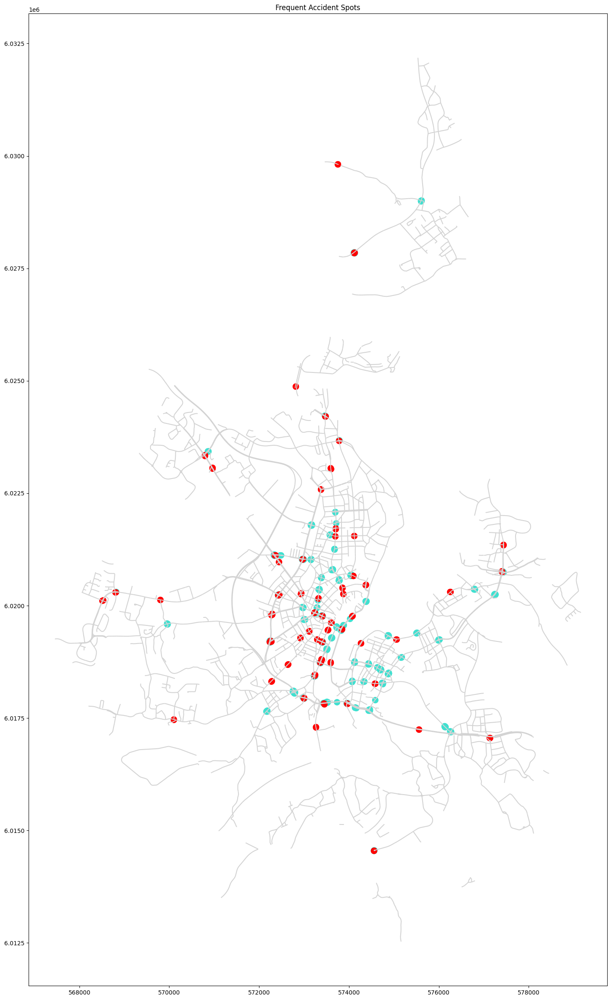

In [20]:
# Extract accidents which overlapped with at least 10 cases.
# Convert the generated dataframe to GeoDataFrame
o10 = overlap_slight[overlap_slight['overlap_len']>10]
o10 = gpd.GeoDataFrame(o10, crs="EPSG:25832", geometry='geo_point')

# Extract accidents which overlapped with at least 1 case.
# Convert the generated dataframe to GeoDataFrame
o2 = overlap_02[overlap_02['overlap_len']>1]
o2 = gpd.GeoDataFrame(o2, crs="EPSG:25832", geometry='geo_point')

# Prepare the roads at the background
# Extract only roads, where any accidents have ever happened.
# Convert the generated dataframe to GeoDataFrame
li_road = set(acc_roa['roa_name'].value_counts().keys())
roa_copy = roa[roa['roa_name'].isin(li_road)].copy()
roa_copy = gpd.GeoDataFrame(roa_copy, crs="EPSG:25832", geometry='geo_line')

# Plot the three-layer figure
fig, ax = plt.subplots(figsize=(30, 30))
ax.set_title("Frequent Accident Spots")
o10.plot(color="turquoise", markersize=100, ax=ax)
o2.plot(color="red", markersize=100, ax=ax)
roa_copy.plot(color="lightgrey", ax=ax)


---
# 5. Medical Rescue Facilities

<h3>The Figure</h3>

This figure focuses on the analysis of effect of the locations and number of the medical rescue facilities on rescue efficiency. 

"Green points" represent ony 'Severely Injured' and 'Killed' accidents that locations and number of medical rescue facilities are critical.  
"Gold polygons" represent the location of hospitals.  
"Magenta points" represent ambulance stations.

<h3>Brief Observation</h3>

From the figure, we see that there are only three ambulance stations, which all located at the center of Kiel. At the north and west part of Kiel do not have any of the stations.  
In addition, 6 of 8 hospitals are also located at the center, two of the 8 are located at far east.  
These two reasons together implied that rescue time would be very inefficient, if accidents happened in locations far from the center of Kiel, especially the west and the north. 

<Axes: title={'center': 'Medical Rescue Facilities and Severe Accidents'}, xlabel='Longitude', ylabel='Latitude'>

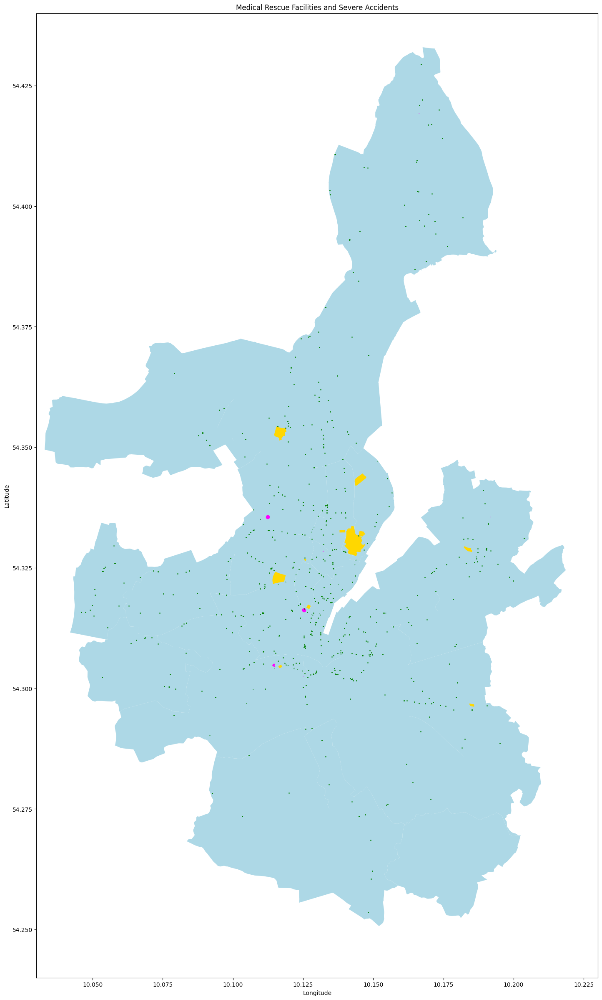

In [21]:
# Control the subplot figure size
# Setting axises limit of the figure
fig, ax = plt.subplots(figsize=(30, 30))
ax.set_xlim([10.03, 10.23])
ax.set_ylim([54.24, 54.44])
ax.set_title("Medical Rescue Facilities and Severe Accidents")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

# Getting the Kiel map
place = "Kiel, Germany"
kiel_admin = ox.features_from_place(query=place, tags={'admin_level':'10'})
kiel_admin.plot(color="lightblue", ax=ax)

# Getting the hospital locations in Kiel
tag_hos = {'amenity': 'hospital'} #, 
kiel_hos = ox.features_from_place(query=place, tags=tag_hos)
kiel_hos.plot(color="gold", ax=ax)

# Getting the ambelance station locations in Kiel
tag_em = {"emergency":"ambulance_station"}
kiel_em = ox.features_from_place(query=place, tags=tag_em)
kiel_em.plot(color="magenta", ax=ax)

# Prepare ""Severely Injured" and "Killed" accident points for analysis
ht = acc[acc['harm_type'].isin(["Severely Injured", "Killed"])]
ht = gpd.GeoDataFrame(ht, crs="EPSG:25832", geometry='geo_point')
ht = ht.to_crs("EPSG:4326")
ht.plot(color="green", markersize=1, ax=ax)


---
# Conclusion

Overall, these visualizations and analyses empower the municipality of Kiel to make informed decisions on road safety interventions. The recommendations can be tailored to address specific challenges in different districts and contribute to the overarching goal of reducing accidents and ensuring the safety of residents.